# SPA632M
# Assignment 3: Fourier Analysis / Wavelet Analysis

Name : Ashwin Raju Kharat

Roll no : 241310004

## Goals
Apply techniques learned in Fourier series / Wavelet Transform and transform lectures to solve the following questions. 

| Problem | Content | Points |
| :--- | :--- | :---: |
| Problem 1 | Effect of Radomisation of information in the FOURIER space using an image | 50 |            
| Problem 2 | For the data of the Sunspots for each year, compute the main period of the oscillations. Use fft. | 61 |
| __Total__ | | __111__ | 


Please send your solution per mail to Rohit and Ankan.

In [1]:
# importing all the packages 

import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from matplotlib.colors import LinearSegmentedColormap
import pywt
from matplotlib.colors import SymLogNorm


# My definations
red_cmap = LinearSegmentedColormap.from_list("black_to_red", [(0, "black"), (1, "red")])
green_cmap = LinearSegmentedColormap.from_list("black_to_green", [(0, "black"), (1, "green")])
blue_cmap = LinearSegmentedColormap.from_list("black_to_blue", [(0, "black"), (1, "blue")])
norm = SymLogNorm(linthresh=1, linscale=1, vmin=-1e3, vmax=1e3, base=10)

# fft of 2d of an image
def FT_2D_numpy(image):
    N1, N2 = image.shape
    dt1 = 1
    dt2 = 1
    f1 = np.fft.fftfreq(N1, dt1)
    f2 = np.fft.fftfreq(N2, dt2)
    f1 = np.fft.fftshift(f1)
    f2 = np.fft.fftshift(f2)
    FT = np.fft.fft2(image) * dt1 * dt2
    FT = np.fft.fftshift(FT)
    return f1, f2, FT

# Reconstruction for the fft
def reconstruct_image_from_fft(fft_image):
    N1, N2 = fft_image.shape
    dt1 = 1
    dt2 = 1
    reconstructed_image = np.fft.ifft2(np.fft.ifftshift(fft_image)) / (dt1 * dt2)
    return np.abs(reconstructed_image)

# image path
image_path = 'img.jpg'
epsilon = 1e-10


## Problem 1: (2-D FFT) Effect of Radomisation of information in the FOURIER space using an image - 50 points

Analyse the provided image data using 2-d FFT package, and study the randomisation on FFT.

(a) Using the red image, decompose 2-D distribution of the absolute value of the Fourier components. Now randomise the pixel data of into both the axis of the image. Compute again the Fourier components; plot the randomise image and reconstructed image. Comment on the differences in the Fourier coefficients and why?   ( 30 point)

(b) Also compute the power spectrum in both cases and highlight the differences. (10 marks)

(c) Explain the behaviour of randomisation on the signal. (10 marks)

### Solution of the problem 1


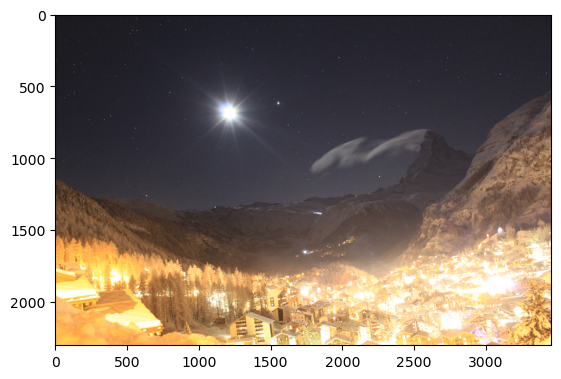

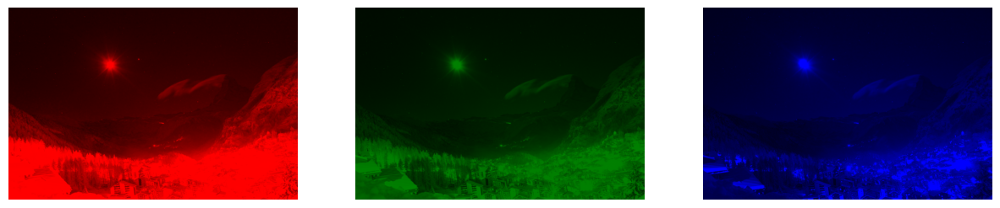

In [2]:
#  Answer 1 a

im = Image.open(image_path) 
image = np.array (im, dtype=np.float32)
plt.imshow(im)

Red = image[:,:,0]
Green = image[:,:,1]
Blue = image[:,:,2]

Images = [Red,Green,Blue]
cmaps = [red_cmap,green_cmap,blue_cmap]
name = ["Red","Green","Blue"]

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
for i in range(0,3):
    axes[i].imshow(Images[i], cmap=cmaps[i])
    axes[i].axis('off')
plt.show()

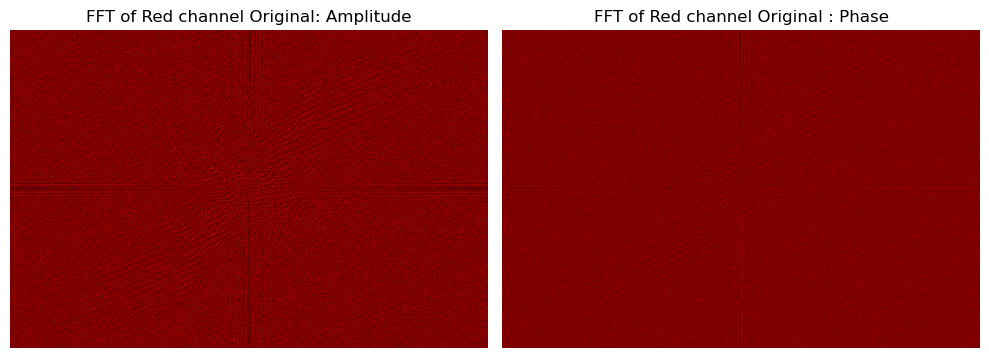

In [3]:
# taking fft of image
f1, f2, FT_Red = FT_2D_numpy(Red)

FT_Red_origninal = FT_Red.copy() 

# ploting
plt.figure(figsize=(10, 5))
plt.subplot(121)
plt.imshow( FT_Red.real, norm = norm, cmap=red_cmap)
plt.title('FFT of Red channel Original: Amplitude')
plt.axis('off')
plt.tight_layout()
plt.subplot(122)
plt.imshow(np.angle(FT_Red), cmap=red_cmap)
plt.title('FFT of Red channel Original : Phase')
plt.axis('off')
plt.tight_layout()
plt.show()





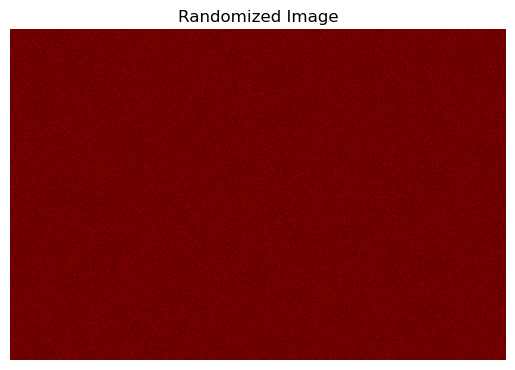

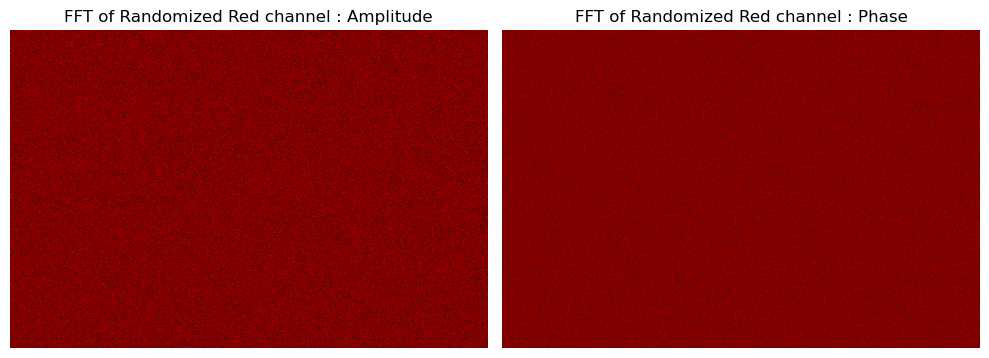

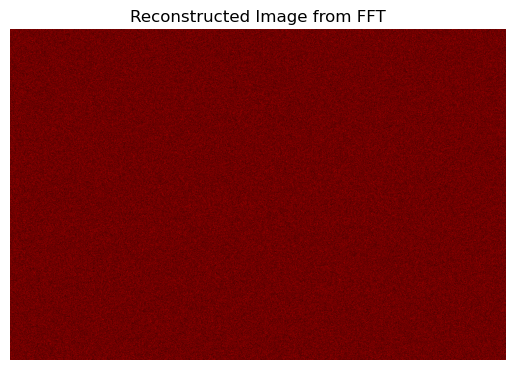

In [4]:
# Randomizing the image and ploting
def randomize_image_2d(image):
    flattened = image.flatten()
    np.random.shuffle(flattened)
    shuffled_image = flattened.reshape(image.shape)
    return shuffled_image

def partial_shuffle_image(image , shuffle_percent = 15):
    flattened = image.flatten()
    num_elements = len(flattened)
    num_to_shuffle = int(num_elements * shuffle_percent / 100)
    indices = np.arange(num_elements)
    np.random.shuffle(indices)
    shuffle_indices = indices[:num_to_shuffle]
    flattened[shuffle_indices] = np.random.permutation(flattened[shuffle_indices])
    shuffled_image = flattened.reshape(image.shape)
    return shuffled_image


shuffled_image = partial_shuffle_image(Red, shuffle_percent=100)
plt.imshow(shuffled_image, cmap=red_cmap)
plt.axis('off')
plt.title('Randomized Image')
plt.show()

# taking fft of image
f1, f2, FT_Red = FT_2D_numpy(shuffled_image)

FT_Red_shuffeled = FT_Red.copy()

# ploting
plt.figure(figsize=(10, 5))
plt.subplot(121)
plt.imshow(FT_Red.real,norm = norm, cmap=red_cmap)
plt.title('FFT of Randomized Red channel : Amplitude')
plt.axis('off')
plt.tight_layout()
plt.subplot(122)
plt.imshow(np.angle(FT_Red), cmap=red_cmap)
plt.title('FFT of Randomized Red channel : Phase')
plt.axis('off')
plt.tight_layout()
plt.show()


# Reconstructing the image  
reconstructed_image = reconstruct_image_from_fft(FT_Red)
plt.imshow(reconstructed_image.real, cmap=red_cmap)
plt.axis('off')
plt.title('Reconstructed Image from FFT')
plt.show()


## Comments on difference in fourier component

See the image of the Original and randomise we see all the information of Amplitude and phase is lost.

The Amplitude and phase in original has a structure and the contribution creates the original image

For the Randomised image. Where we have randomised in all the 2d we see that the information of frequency and phase is constent and is lost.

Also after we reconstruct the image all we see is the random noise no structure in image.




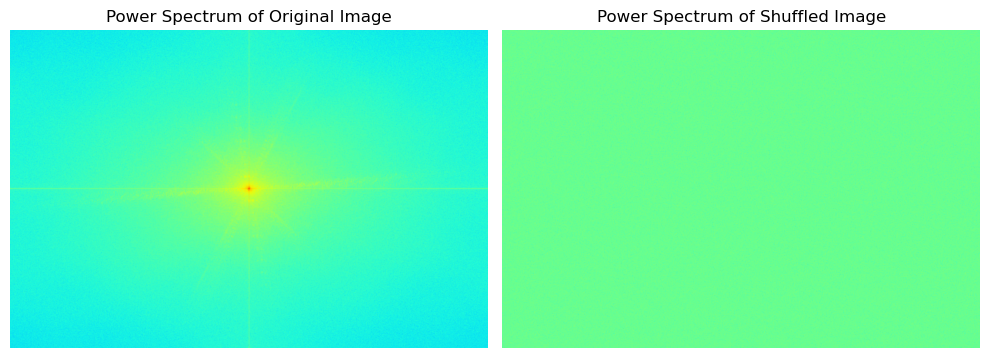

In [5]:
#  Answer 1 b

# power spectrum of fourier components 2d
def power_spectrum_2d(fft_image):
    return np.abs(fft_image) ** 2

# ploting the power spectrum
def plot_power_spectrum(fft_image, title):
    power_spectrum = power_spectrum_2d(fft_image)
    norm_local = SymLogNorm(linthresh=1, linscale=1, vmin=np.min(power_spectrum), vmax=np.max(power_spectrum), base=10)
    plt.imshow(power_spectrum, norm = norm_local,  cmap = 'jet')
    plt.title(title)
    plt.axis('off')
    #plt.colorbar(fraction=0.04)
    #plt.show()

plt.figure(figsize=(10, 5))
plt.subplot(121)
plot_power_spectrum(FT_Red_origninal, 'Power Spectrum of Original Image')
plt.subplot(122)
plot_power_spectrum(FT_Red_shuffeled, 'Power Spectrum of Shuffled Image')
plt.tight_layout()
plt.show()


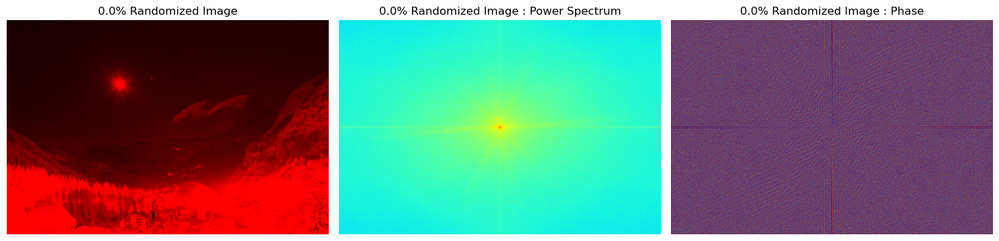

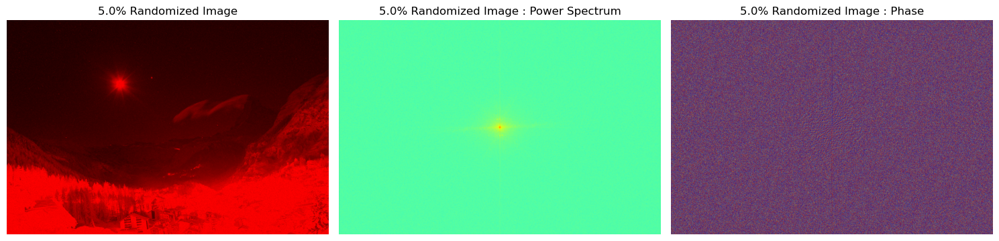

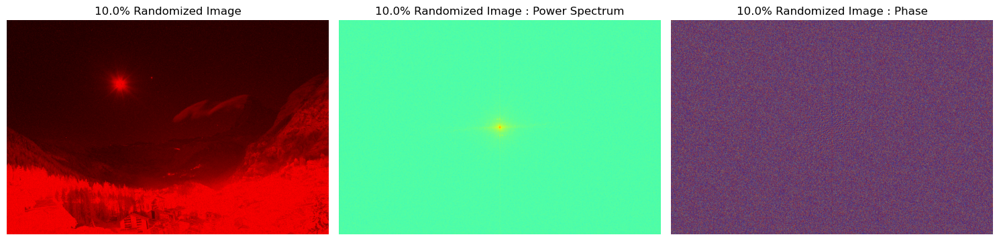

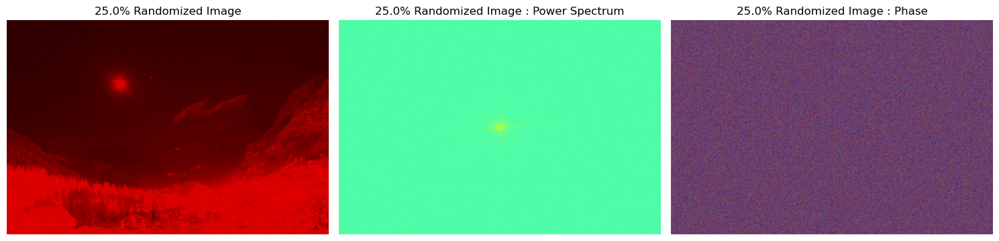

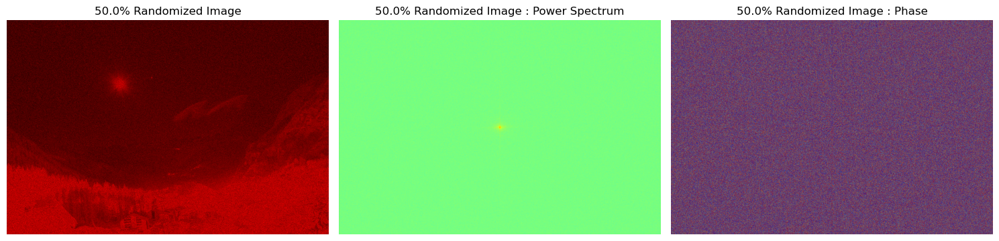

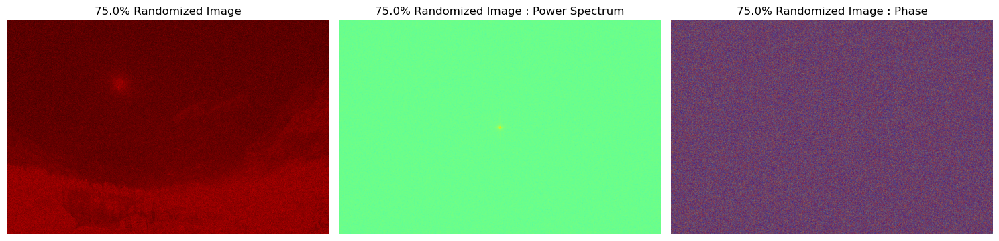

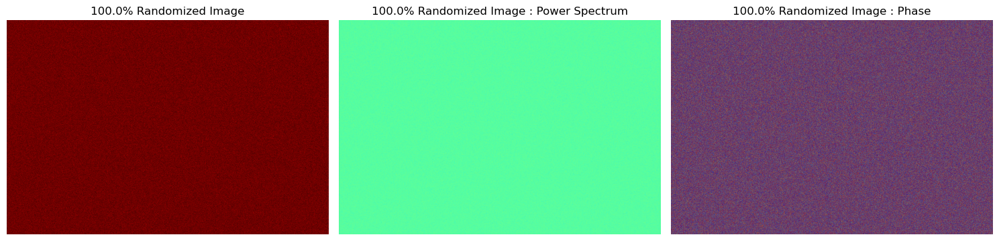

In [6]:
# doing for partial randomization
per_rand = [0.0, 5.0, 10.0, 25.0, 50.0,75.0,100.0]

# ploting Reconstructed image , amplitude phase power

def ploting(per_rand, image, FT_image, title):
    plt.figure(figsize=(15, 5))
    plt.subplot(131)
    plt.imshow(image, cmap=red_cmap)
    plt.axis('off')
    plt.title(title )
    plt.subplot(132)
    plot_power_spectrum(FT_image, title + ' : Power Spectrum')
    plt.subplot(133)

    phase = np.angle(FT_image)
    norm_local = SymLogNorm(linthresh=1, linscale=1, vmin=np.min(phase), vmax=np.max(phase), base=10)
    plt.imshow(phase,norm = norm_local,cmap = 'jet')
    plt.axis('off')
    plt.title(title + ' : Phase')
    plt.tight_layout()
    plt.show()

# doing for all the randomization
for i in per_rand:
    shuffled_image = partial_shuffle_image(Red, shuffle_percent=i)
    f1, f2, FT_Red = FT_2D_numpy(shuffled_image)
    ploting(i, shuffled_image, FT_Red, '{}% Randomized Image'.format(i))


### Answer 1. c effect of randomization.

When we randomise the points in image we loose all the structure and details.
All the morphological information is lost.

For my comparision i did the partial randimization with percent of randimization which makes the effect clearer as we randomize more and more 
We loose the structure in the frequency component and the pattern starts to distribute more evenly.
And the power spectra tends to become flatter.

## Problem 2: Discrete Wavelet Analysis ##
Consider the same image given in question 1. (61 points)


(a) Using 2-D discrete wavelet transform decompose the image, and obtain the horizontal, vertical and diagonal wavelet coefficients for two Daubechies wavelets, i.e. db1 and db20, and haar wavelet. (15 marks)

(b) Plot these three discrete wavelets and comment on the profile. (9 marks)

(c) Plot the wavelet approaximation, and the coefficients for the three wavelets. (12 marks) 

(d) Plot the difference in the horizontal, vertical and diagonal wavelet coefficients between (1) db1 and db20, (2) db1 and haar, and (3) db20 and haar. (9 marks) 

(e) Explain the expectation, results and the similarity and the differences in the permutation of the three wavelets. (16 marks)

Hint: Use ``dwt2`` function in ``pywt``.

### Solution of problem 2

In [7]:
# Answer 2a

image_np = np.array(Image.open(image_path).convert('L'), dtype=np.float32)

coeffs_db1 = pywt.dwt2(image_np, 'db1',mode='periodization')
coeffs_db20 = pywt.dwt2(image_np, 'db20',mode='periodization')
coeffs_haar = pywt.dwt2(image_np, 'haar',mode='periodization')

A_db1, (H_db1, V_db1, D_db1) = coeffs_db1
A_db20, (H_db20, V_db20, D_db20) = coeffs_db20
A_haar, (H_haar, V_haar, D_haar) = coeffs_haar


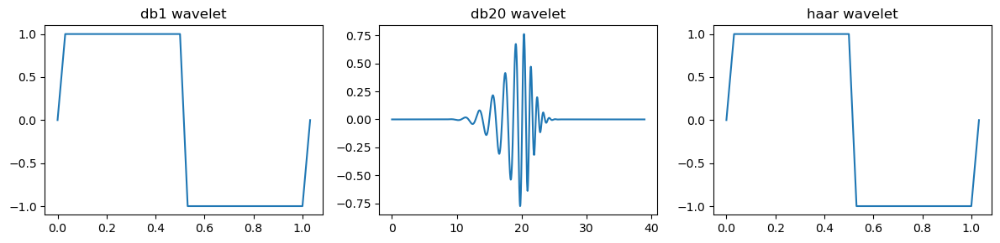

In [8]:
# Answer 2b

wavelets = ['db1', 'db20', 'haar']
plt.figure(figsize=(12, 3))
for i, wave in enumerate(wavelets):
    wavelet = pywt.Wavelet(wave)
    phi, psi, x = wavelet.wavefun(level=5)
    plt.subplot(1, 3, i+1)
    plt.plot(x, psi)
    plt.title(f'{wave} wavelet')
plt.tight_layout()
plt.show()


### comment on the profile

The above plot of db1 is like square wave. And it has sharpe change and so usefull in detecting the sharpe features in the image or data.

The db20 is a combination of a sinosodal feature with a gaussian. This is good at representin a smooth polynomial up to 19 degrees or less. And good to find the  smooth transition in data. In our case we see that we are able to see the smeared stars clearly.

Haar is the specal case of Daubechies and is db1.



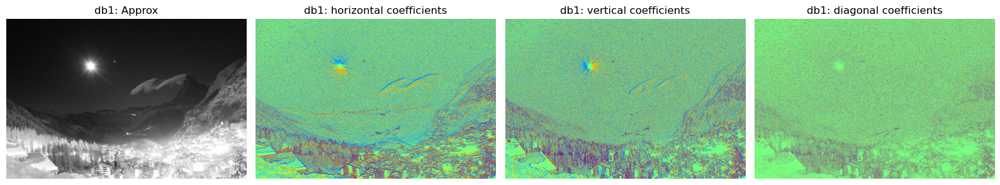

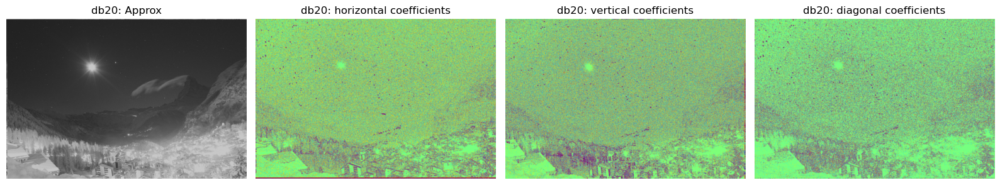

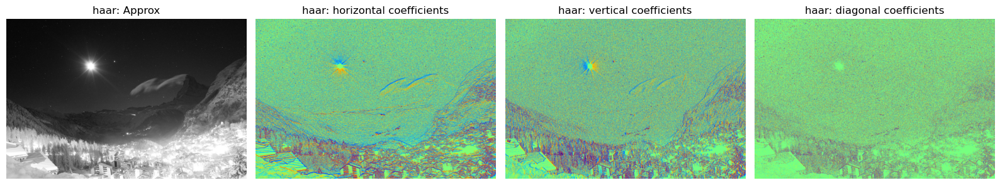

In [9]:
# Answer 2c

def plot_coefficients(A, H, V, D, title):
    plt.figure(figsize=(16, 4))

    plt.subplot(1, 4, 1); plt.imshow(A, cmap='gray'); plt.title(f'{title}: Approx'); plt.axis('off')
    norm_local = SymLogNorm(linthresh=1, linscale=1, vmin=np.min(H), vmax=np.max(H), base=10)
    plt.subplot(1, 4, 2); plt.imshow(H, norm=norm_local,cmap='jet'); plt.title(f'{title}: horizontal coefficients'); plt.axis('off')
    norm_local = SymLogNorm(linthresh=1, linscale=1, vmin=np.min(V), vmax=np.max(V), base=10)

    plt.subplot(1, 4, 3); plt.imshow(V , norm=norm_local,cmap='jet'); plt.title(f'{title}: vertical coefficients'); plt.axis('off')
    norm_local = SymLogNorm(linthresh=1, linscale=1, vmin=np.min(D), vmax=np.max(D), base=10)

    plt.subplot(1, 4, 4); plt.imshow(D, norm=norm_local,cmap='jet'); plt.title(f'{title}: diagonal coefficients'); plt.axis('off')
    plt.tight_layout()
    plt.show()

plot_coefficients(A_db1, H_db1, V_db1, D_db1, 'db1')
plot_coefficients(A_db20, H_db20, V_db20, D_db20, 'db20')
plot_coefficients(A_haar, H_haar, V_haar, D_haar, 'haar')


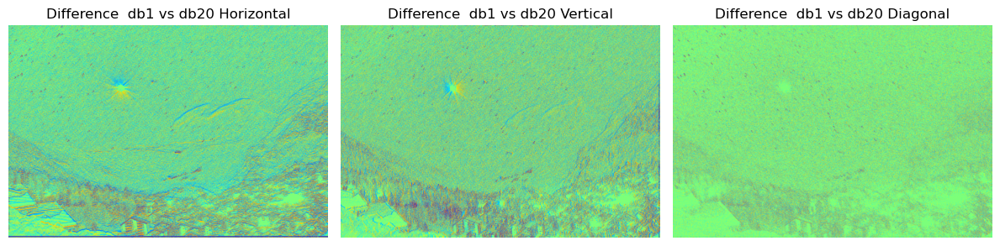

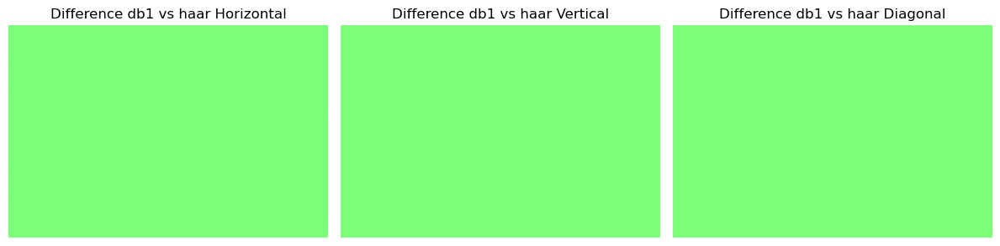

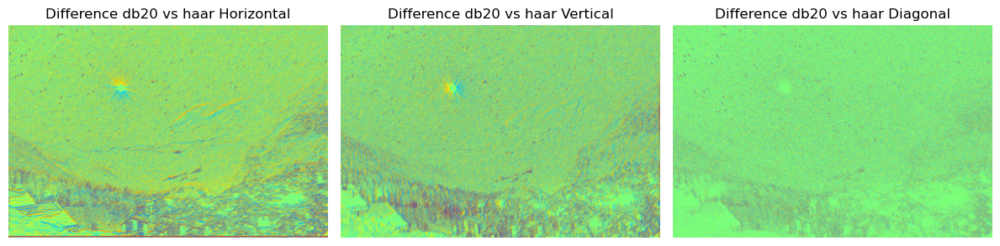

In [10]:
# Answer 2d

def plot_the_difference(A, B, title):

    plt.figure(figsize=(12, 3))
    Lable = ['Horizontal', 'Vertical', 'Diagonal']
    for i in range(len(A)):
        plt.subplot(1, 3, i+1)
        P = A[i] - B[i]
        plt.imshow(P, norm = norm, cmap='jet')
        plt.axis('off')
        plt.title(f'{title} {Lable[i]}')
    plt.tight_layout()
    plt.show()

plot_the_difference((H_db1, V_db1, D_db1), (H_db20, V_db20, D_db20), 'Difference  db1 vs db20')
plot_the_difference((H_db1, V_db1, D_db1), (H_haar, V_haar, D_haar), 'Difference db1 vs haar')
plot_the_difference((H_db20, V_db20, D_db20), (H_haar, V_haar, D_haar), 'Difference db20 vs haar')


### Result


We do expect to see the sharp feature in db1 and Haar and smoother features more clearly in db20

As we have expected the db1 and haar have the sharp example the cloud and the mountain edges and the house room and edge.

Where as the db20 is able to find the features like the star where are smeared and smooth. But this is easy to see in db20

Also pay attention to the colour of the features in the horizontal and vertical. Where the coefficient are changing values accordingly to the direction of coefficient.



Also in the Difference as harr and db1 is same we have flat.
And for the horidontal vertical we have extracted the features which are more prevelent in the direction where for diagonal we got the point features.


# ---- The End ----
